In [26]:
#load the needed directories
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#load the gender.csv file as a dataframe
df_gender = pd.read_csv('./gender.csv')
df_gender.head()

,auhtor_ID,post,female
0,t2_rnjzutp,Good on you for being responsible! I know self...,1
1,t2_rnjzutp,"must go to the grocery store with their child,...",1
2,t2_rnjzutp,"things on her videos, and YouTube took the vid...",1
3,t2_rnjzutp,their app. There's also a program called SYNC ...,1
4,t2_rnjzutp,"side. If the cops don't take your side, you'll...",1


'must go to the grocery store with their child, you can ask one of these two questions to encourage them to make a choice: "We have to go to the grocery store. Do you want to wear the red dino shirt or the blue moon shirt?" and "We have to go to the store to get groceries. Do you want to go to Food Lion or Piggly Wiggly?" The "trick" is that both of the options you are offering to the child are "good" or "healthy" choices. The adult in this scenario will ultimately make it to the store as planned, and their child will be able to express autonomy which is important for them to develop independence. Failure should be handled with persistence and patience. I cannot tell you how many times I got screamed at and cussed at while sitting at my grandparents\' kitchen table trying to do math. It made math an unbearable subject for me that ended up being a constant source of fear and stress throughout my childhood and teen life. Meeting failure with anger is very damaging to the child. Let\'s sa

In [3]:
#see how many posts we have information on
len(df_gender)

44635

In [4]:
len(df_gender['post'].unique())

44635

In [5]:
# since the number of unique posts is equal to the number of values in the dataset we can conclude that 
# we have no duplicates in our dataset that we need to account for before dividing into training and test data. 

In [6]:
#from this we can see that we do not have any missing values in the dataset. 
df_gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44635 entries, 0 to 44634
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   auhtor_ID  44635 non-null  object
 1   post       44635 non-null  object
 2   female     44635 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.0+ MB


In [8]:
len(df_gender['auhtor_ID'].unique())

2401

In [9]:
#see if the posts are equally divided between female and non
percentage_female_posts = len(df_gender[df_gender['female']==1])/len(df_gender) * 100
percentage_female_posts

46.73014450543296

In [10]:
df_female = df_gender[df_gender['female']==1]
len(df_female['auhtor_ID'].unique())

1281

In [11]:
#check the division of non-female and female
df_female.count()

auhtor_ID    20858
post         20858
female       20858
dtype: int64

In [12]:
1281/2401 * 100

53.352769679300295

In [13]:
df_non_female = df_gender[df_gender['female']==0]
df_non_female.head()

,auhtor_ID,post,female
17,t2_2ht4n2g,It also looks like you need a trim as well and...,0
18,t2_2ht4n2g,or it dint happen The Enter-taint-ment industr...,0
19,t2_bbe41,Mall of The Netherlands near The Hague is an A...,0
20,t2_bbe41,cause a person to support one form of disrespe...,0
21,t2_bbe41,"the benefits of being in the EU, the same voti...",0


In [14]:
df_non_female.count()

auhtor_ID    23777
post         23777
female       23777
dtype: int64

In [20]:
# add the number of words in a post to see if all posts are approximately the same length or if non female posts are maybe
# longer or shorter than female posts
i = 0
df_gender['num_words'] = 0
while i < len(df_gender):
    df_gender['num_words'][i] = len(df_gender['post'][i].split())
    i += 1

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_g

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_g

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_g

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_g

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['num_words'][i] = len(df_gender['post'][i].split())
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\1007333564.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

In [24]:
df_female = df_gender[df_gender['female']==1]
print(len(df_female['num_words'].unique()))
df_non_female = df_gender[df_gender['female']==0]
print(len(df_non_female['num_words'].unique()))

681
618


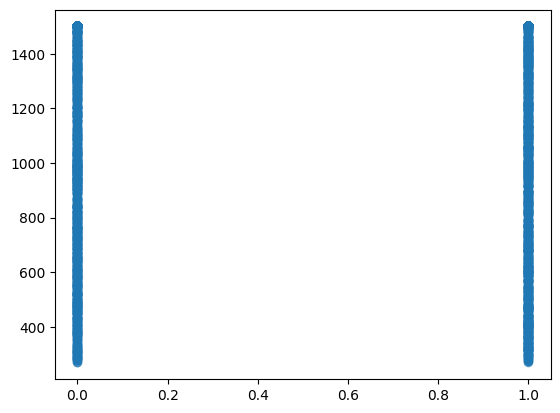

In [28]:
plt.scatter(df_gender['female'], df_gender['num_words'], alpha=0.5)
plt.show()

In [29]:
df_female['num_words'].describe()

count    20858.000000
mean      1469.523492
std        155.868470
min        269.000000
25%       1500.000000
50%       1500.000000
75%       1500.000000
max       1500.000000
Name: num_words, dtype: float64

In [31]:
df_non_female['num_words'].describe()

count    23777.000000
mean      1476.836523
std        135.350944
min        271.000000
25%       1500.000000
50%       1500.000000
75%       1500.000000
max       1500.000000
Name: num_words, dtype: float64

In [67]:
shortest_f = df_female[df_female['num_words']==269]
shortest_n = df_non_female[df_non_female['num_words']==271]
f=shortest_f['post'][25681]
n= shortest_n['post'][40084]
print(f'{n} /n/n {f}')
#print(shortest_f['post'][25681])

empty. Very very empty. But in that empty nothing there is everything. &amp;#x200B; &gt;You’re being overly specific and I’m talking generalities man. OK, in what way is the first statement generally true? We know it's not true in scientific terms, because even the most rarefied physical space is filled with the quantum vacuum. It's not empty philosophically, because it is constructed from concepts that exist in our minds. The instant you consider a space that is empty, it is inserted into an ontological structure. Is it empty psychologically perhaps? Depends on how you define empty. An empty glass is full of air...so it's full. An empty head still has electrical activity going on; ideas. So-called empty calories are energy dense. How else is it empty? I guess in the mind of a nihilist, but that's just impractical semantics. Excellently necessary point! Someone needs to rename this page then: [url It seems like there’s a conflict. On the one hand you know you are sexually attracted to 

In [68]:
print(n)


empty. Very very empty. But in that empty nothing there is everything. &amp;#x200B; &gt;You’re being overly specific and I’m talking generalities man. OK, in what way is the first statement generally true? We know it's not true in scientific terms, because even the most rarefied physical space is filled with the quantum vacuum. It's not empty philosophically, because it is constructed from concepts that exist in our minds. The instant you consider a space that is empty, it is inserted into an ontological structure. Is it empty psychologically perhaps? Depends on how you define empty. An empty glass is full of air...so it's full. An empty head still has electrical activity going on; ideas. So-called empty calories are energy dense. How else is it empty? I guess in the mind of a nihilist, but that's just impractical semantics. Excellently necessary point! Someone needs to rename this page then: [url It seems like there’s a conflict. On the one hand you know you are sexually attracted to 

In [69]:
print(f)

a “fluffy” woman and I appreciate your honesty. I don’t expect everyone to be attracted to me nor am I attracted to everyone I meet. I would much rather have honest pictures so you can decide if I’m too big or not your type for whatever reason. Having said that, I’m starting with a trainer this week so while I would definitely not put pictures online today…in 3 months I might rethink that. I haven’t dated since COVID and not getting any younger!! S-Town is my all time favorite and has gotten me through multiple road trips awake! Wait until the first leaves (the cotyledon) start to die. Thank you!! He made fun of a trans woman getting coffee at the coffee shop where we met. I tried explaining that wasn’t cool with me, and he listened intently while I explained how I felt…that nobody asks to be misgendered and we should celebrate her bravery to be who she is inside. We talked about biological differences and I thought he was actually listening. But his final words: “you’ve gotta admit it

In [71]:
print(df_female['post'][0])

Good on you for being responsible! I know self-discipline is difficult, but it's good that you've got your priorities in order. Good luck on your finals. I'm sorry that happened. I think the people who said that genuinely believed it was the best option for you so I can't be too mad at them. I posted below and I'll say it again: that 0 tolerance response is likely due to trauma and stress involving some sort of mistreatment those people endured in the past. They're not saying it to be malicious, they're just saying it because that's the measure they would feel is necessary to protect themselves if they were in that situation. It's their own way of looking out for you, just how I suggested talking it out. I'm happy the two of you did talk and that he made it up to you, and I hope your relationship continues to be happy and healthy. Sending love and light 🕯️💗 They're both single so I don't understand why they have to hide their relationship. I never have understood it. Also, the fact tha

In [72]:
df_non_female.head()

,auhtor_ID,post,female,num_words
17,t2_2ht4n2g,It also looks like you need a trim as well and...,0,1500
18,t2_2ht4n2g,or it dint happen The Enter-taint-ment industr...,0,551
19,t2_bbe41,Mall of The Netherlands near The Hague is an A...,0,1500
20,t2_bbe41,cause a person to support one form of disrespe...,0,1500
21,t2_bbe41,"the benefits of being in the EU, the same voti...",0,1500


In [73]:
df_non_female['post'][17]

"It also looks like you need a trim as well and it will look better Tattoos usually take 10 days to heal and then usually settles in 14-25 days. The wait is usually for healing + to see the immune response on how body handles the ink under the skin. Some people fade more or lose the ink and really depends Also some artists even wait 1 month between sessions for best result I (28M) get absolute joy going down on women. I look forward to it . I met this woman in her late 30s a few months back. After a fee drinks , a bit of foreplay , i slowly moved down , kissing as i go along to slowly ease into it . She was beautiful and her pussy looked and smelled amazing .I start, and it slowly intensified and we moved into a 69 position. As i spread the cheeks to better position my tongue , I SEE IT. A little piece of dried out SHIT stuck tight on her asshole . It really caught me off-guard and i dint know what to do next I excused myself a minute later , acted like i got an important text from a f

as seen above there seems to be only a very slight difference in length of posts for female and non female, non_female posts are slightly longer, although their 1st, 2nd, 3rd and 4th quartile are identical. So there is only a small change in the smallest 25 % of their posts. And also the shortest posts are very close. For female posts the shortest consists of 269 words while for non female it consists of 271 words, so there is only a difference of 2 words. 

In [33]:
pip install wordcloud

  Obtaining dependency information for wordcloud from https://files.pythonhosted.org/packages/00/09/abb305dce85911b8fba382926cfc57f2f257729e25937fdcc63f3a1a67f9/wordcloud-1.9.4-cp311-cp311-win_amd64.whl.metadata
   ---------------------------------------- 0.0/299.9 kB ? eta -:--:--
   -- ------------------------------------ 20.5/299.9 kB 330.3 kB/s eta 0:00:01
   ------------ --------------------------- 92.2/299.9 kB 1.1 MB/s eta 0:00:01
   ---------------------------------------- 299.9/299.9 kB 2.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [34]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

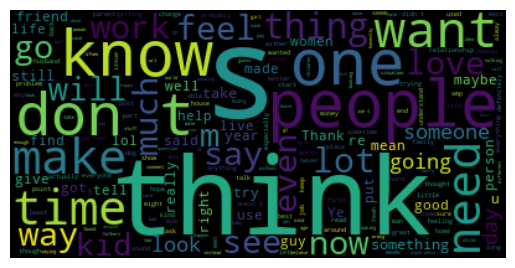

In [36]:
#generate 1 text containing all female texts
female_text = ' '.join(df_female['post'])


wordcloud = WordCloud().generate(female_text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

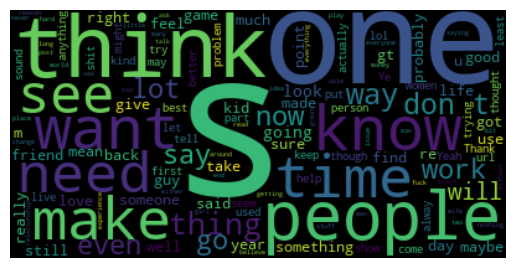

In [37]:
#generate 1 text containing all female texts
non_female_text = ' '.join(df_non_female['post'])


wordcloud = WordCloud().generate(non_female_text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [39]:
pip install textblob

  Obtaining dependency information for textblob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
  Obtaining dependency information for nltk>=3.8 from https://files.pythonhosted.org/packages/4d/66/7d9e26593edda06e8cb531874633f7c2372279c3b0f46235539fe546df8b/nltk-3.9.1-py3-none-any.whl.metadata
  Obtaining dependency information for regex>=2021.8.3 from https://files.pythonhosted.org/packages/80/32/763a6cc01d21fb3819227a1cc3f60fd251c13c37c27a73b8ff4315433a8e/regex-2024.11.6-cp311-cp311-win_amd64.whl.metadata
     ---------------------------------------- 0.0/41.5 kB ? eta -:--:--
     ------------------ ------------------- 20.5/41.5 kB 640.0 kB/s eta 0:00:01
     -------------------------------------- 41.5/41.5 kB 666.1 kB/s eta 0:00:00
   ---------------------------------------- 0.0/626.3 kB ? eta -:--:--
   ------------------ --------------------- 286.7/626.3 kB 5.9 MB/s eta 0

In [40]:
from textblob import TextBlob


In [44]:
i = 0
df_gender['sentiment'] = 0
while i < len(df_gender):
    df_gender['sentiment'][i] = TextBlob(df_gender['post'][i]).sentiment.polarity
    i += 1

C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\3919516257.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gender['sentiment'][i] = TextBlob(df_gender['post'][i]).sentiment.polarity
C:\Users\20224435\AppData\Local\Temp\ipykernel_29340\3919516257.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.0796600209686147' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_gender['sentiment'][i] = TextBlob(df_gender['post'][i]).sentiment.polarity


In [45]:
df_gender.head()

,auhtor_ID,post,female,num_words,sentiment
0,t2_rnjzutp,Good on you for being responsible! I know self...,1,1500,0.079660
1,t2_rnjzutp,"must go to the grocery store with their child,...",1,1500,0.129972
2,t2_rnjzutp,"things on her videos, and YouTube took the vid...",1,1500,0.187606
3,t2_rnjzutp,their app. There's also a program called SYNC ...,1,1500,0.131978
4,t2_rnjzutp,"side. If the cops don't take your side, you'll...",1,1500,0.133287


In [41]:
stopwords = set(STOPWORDS)
print(stopwords)

{'very', 'yourself', 'in', 'why', 'have', "hadn't", 'since', 'is', "let's", 'off', "here's", 'their', 'also', "who's", 'once', 'an', 'would', "she's", 'do', 'or', "hasn't", 'who', 'they', 'are', "couldn't", 'hence', 'only', 'therefore', 'at', 'like', 'myself', 'between', 'am', 'him', 'after', "we'd", 'these', "they've", 'r', "won't", 'com', "when's", 'any', 'there', 'during', "i've", "she'd", 'up', 'whom', 'by', "you'll", "shan't", 'no', 'http', 'being', 'yourselves', 'more', 'had', "you'd", "shouldn't", 'further', 'i', 'ourselves', 'himself', 'other', 'having', "we're", "he's", 'below', "i'll", 'all', "doesn't", 'this', "there's", 'what', 'over', "what's", 'he', "they're", 'hers', 'that', 'them', "can't", "wouldn't", 'against', 'herself', 'could', 'should', 'under', 'be', "we'll", 'above', 'ours', 'ought', 'too', 'theirs', 'been', 'same', 'and', 'here', 'has', 'each', "she'll", 'when', 'your', 'her', 'otherwise', 'so', 'was', 'some', 'while', "they'll", 'a', 'can', 'with', "he'd", 'hi

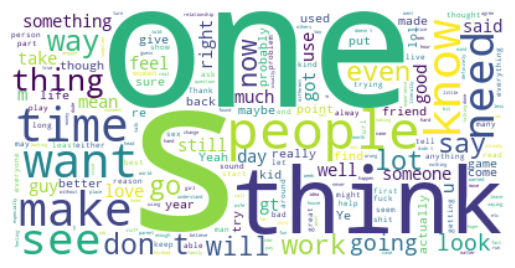

In [46]:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(non_female_text)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

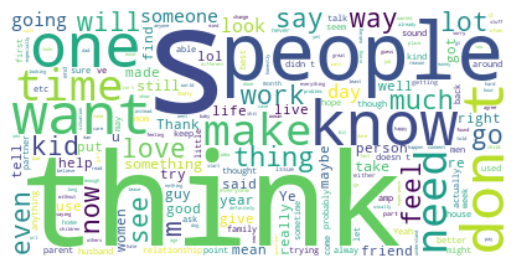

In [47]:
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(female_text)
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

non female text are more likely to use one in their text while female are more like to use know and think is also a bit bigger in the female stopword wordcloud then it is in the non-female version. We can see that need and people are common in both. Since both wordclouds and the stopword wordclouds are very similar it seems like the text do not differ much across female and non female text

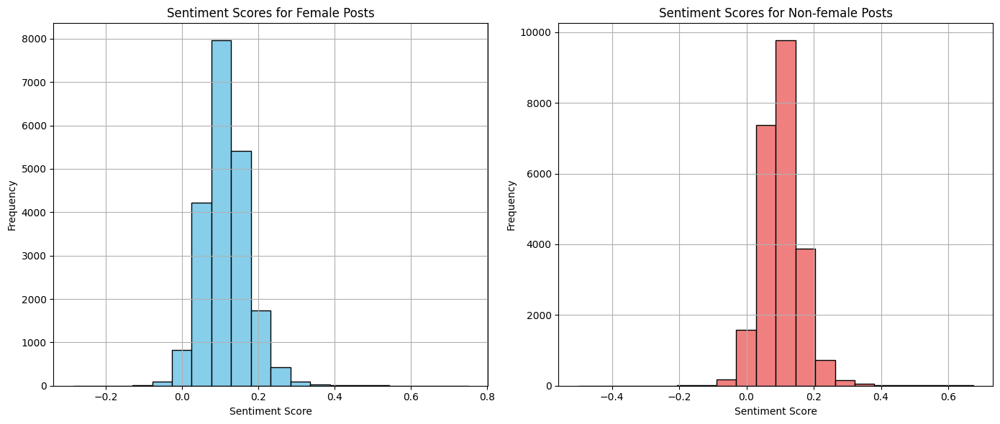

In [74]:
# Plotting Histograms
plt.figure(figsize=(14, 6))

# Female Posts Sentiment Histogram
plt.subplot(1, 2, 1)
df_gender[df_gender['female'] == 1]['sentiment'].hist(bins=20, color='skyblue', edgecolor='black')
plt.title('Sentiment Scores for Female Posts')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

# Male Posts Sentiment Histogram
plt.subplot(1, 2, 2)
df_gender[df_gender['female'] == 0]['sentiment'].hist(bins=20, color='lightcoral', edgecolor='black')
plt.title('Sentiment Scores for Non-female Posts')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

# Display Plot
plt.tight_layout()
plt.show()

In [50]:
df_gender[df_gender['female'] == 0]['sentiment'].describe()

count    23777.000000
mean         0.104178
std          0.059403
min         -0.500000
25%          0.067378
50%          0.101804
75%          0.136883
max          0.673871
Name: sentiment, dtype: float64

In [51]:
df_gender[df_gender['female'] == 1]['sentiment'].describe()

count    20858.000000
mean         0.114676
std          0.058556
min         -0.285714
25%          0.077259
50%          0.111624
75%          0.147480
max          0.750000
Name: sentiment, dtype: float64

we can see that the sentiment of female posts is slightly higher than that of non-female posts
